# Import

In [1]:
# Importaciones necesarias
%pip  install seaborn
import pandas as pd
import numpy as np
from numpy import nan
from numpy.random import randn
from numpy import percentile
import seaborn as sns
import statistics
from statistics import mode
import json
import pandas as pd
import numpy as np
import re
%pip install wordcloud
from wordcloud import WordCloud
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from numpy import asarray
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import matplotlib

Note: you may need to restart the kernel to use updated packages.



In [25]:
df = pd.read_csv('Data_completa_enrriquecida.csv')

In [26]:
df.head(10)

,Letra,Idioma,lyrics_state,hasLetra,Lyrics,Lyrics_proces,songId,track_uri,track_name,artist_uri,...,dominance_tags,mbid,spotify_id,genre,cuadrante,cuadReal,lexicones,emociones,emocionesLetra,emocion_mas_comun
0,Data/Letras/1-'Till-I-Collapse-Eminem.txt,en,complete,1.0,TranslationsEspañolTürkçePortuguêsItalianoहिन्...,cause feel tired left left feel weak feel weak...,till-i-collapse-eminem.txt,spotify:track:4xkOaSrkexMciUUogZKVTS,Till I Collapse,spotify:artist:7dGJo4pcD2V6oG8kP0tJRR,...,5.690625,cab93def-26c5-4fb0-bedd-26ec4c1619e1,4xkOaSrkexMciUUogZKVTS,rap,3,2,[0. 2. 0. 0. 0. 2. 6. 0. 0. 2.],"['anticipation', 'negative', 'positive', 'trust']","['3', '2', '1', '3']",3
1,Data/Letras/2-St.-Anger-Metallica.txt,en,complete,1.0,St. Anger Lyrics[Verse]\nSaint Anger 'round my...,saint anger round neck saint anger round neck ...,st.-anger-metallica.txt,spotify:track:3fOc9x06lKJBhz435mInlH,St. Anger,spotify:artist:2ye2Wgw4gimLv2eAKyk1NB,...,5.427250,727a2529-7ee8-4860-aef6-7959884895cb,3fOc9x06lKJBhz435mInlH,metal,3,2,[0. 6. 0. 0. 0. 6. 0. 0. 0. 0.],"['anticipation', 'negative']","['3', '2']",3
2,Data/Letras/3-Speedin'-Rick-Ross.txt,en,complete,1.0,Speedin’ Lyrics[Intro: Rick Ross]\nLegendary\n...,legendary runners know trilla dollar count acc...,speedin-rick-ross.txt,spotify:track:3Y96xd4Ce0J47dcalLrEC8,Speedin',spotify:artist:1sBkRIssrMs1AbVkOJbc7a,...,5.490000,NaN,3Y96xd4Ce0J47dcalLrEC8,rap,3,2,[0. 2. 0. 0. 0. 2. 0. 0. 0. 0.],"['anticipation', 'negative']","['3', '2']",3
3,Data/Letras/4-Bamboo-Banga-M.I.A..txt,en,complete,1.0,"Bamboo Banga Lyrics[Intro]\nRoad runner, road ...",road runner road runner going miles hour road ...,bamboo-banga-m.i.a..txt,spotify:track:6tqFC1DIOphJkCwrjVzPmg,Bamboo Banga,spotify:artist:0QJIPDAEDILuo8AIq3pMuU,...,5.691357,99dd2c8c-e7c1-413e-8ea4-4497a00ffa18,6tqFC1DIOphJkCwrjVzPmg,hip-hop,3,1,[0. 0. 0. 0. 0. 0. 4. 0. 0. 0.],['positive'],['1'],1
4,Data/Letras/5-Die-MF-Die-Dope.txt,en,complete,1.0,Die MF Die Lyrics[Intro]\nDie!\n\n[Verse 1]\nI...,die need forgiveness need hate need acceptance...,die-mf-die-dope.txt,spotify:track:5bU4KX47KqtDKKaLM4QCzh,Die MF Die,spotify:artist:7fWgqc4HJi3pcHhK8hKg2p,...,5.441765,b9eb3484-5e0e-4690-ab5a-ca91937032a5,5bU4KX47KqtDKKaLM4QCzh,metal,3,1,[0. 1. 0. 0. 0. 1. 0. 0. 0. 0.],"['anticipation', 'negative']","['3', '2']",3
5,Data/Letras/6-Step-Up-Drowning-Pool.txt,en,complete,1.0,"Step Up Lyrics[Intro]\nOne, two, three, go!\n\...",broken yeah living edge broken dream nothin ye...,step-up-drowning-pool.txt,spotify:track:4Q1w4Ryyi8KNxxaFlOQClK,Step Up,spotify:artist:1E4r4z7ivGUcSAnCbINJ9v,...,4.726389,49e7b4d2-3772-4301-ba25-3cc46ceb342e,4Q1w4Ryyi8KNxxaFlOQClK,metal,3,1,[0. 2. 0. 0. 0. 2. 0. 0. 0. 0.],"['anticipation', 'negative']","['3', '2']",3
6,Data/Letras/7-Feedback-Kanye-West.txt,en,complete,1.0,TranslationsEspañolPortuguêsEnglishSvenskaFeed...,ayy heard good news sleeping huh good snooze w...,feedback-kanye-west.txt,spotify:track:49fT6owWuknekShh9utsjv,Feedback,spotify:artist:5K4W6rqBFWDnAN6FQUkS6x,...,5.490000,NaN,49fT6owWuknekShh9utsjv,hip-hop,3,2,[0. 1. 1. 1. 0. 2. 0. 1. 0. 0.],"['anticipation', 'disgust', 'fear', 'negative'...","['3', '2', '2', '2', '4']",2
7,Data/Letras/8-7-Words-Deftones.txt,en,complete,1.0,7 Words Lyrics[Verse 1]\nI'll never be the sam...,ill breaking decency tree trunk fall living ro...,7-words-deftones.txt,spotify:track:6DoXuH326aAYEN8CnlLmhP,7 Words,spotify:artist:6Ghvu1VvMGScGpOUJBAHNH,...,4.729091,1a826083-5585-445f-a708-415dc90aa050,6DoXuH326aAYEN8CnlLmhP,nu metal,3,1,[0. 1. 0. 0. 0. 1. 0. 0. 0. 0.],"['anticipation', 'negative']","['3', '2']",3
8,Data/Letras/9-Limp-Fiona-Apple.txt,en,complete,1.0,TranslationsFrançaisLimp Lyrics[Verse 1]\nYou ...,wanna sick wanna lick wounds baby want badge h...,limp-fiona-apple.txt,spotify:track:104YdibC7VQy78xAVmgRYr,Limp,spotify:artist:3g2kUQ6tHLLbmkV7T4GPtL,...,4.626735,4435982c-b83e-4daa-af2b-9f3430036bb7,104YdibC7VQy78xAVmgRYr,singer-songwriter,3,2,[0. 3. 0. 0. 0. 3. 0. 0. 0. 0.],"['anticipation', 'ne

In [27]:
df.shape

(24966, 50)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24966 entries, 0 to 24965
Data columns (total 50 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Letra                   24966 non-null  object 
 1   Idioma                  24848 non-null  object 
 2   lyrics_state            24966 non-null  object 
 3   hasLetra                24966 non-null  float64
 4   Lyrics                  24966 non-null  object 
 5   Lyrics_proces           24966 non-null  object 
 6   songId                  24966 non-null  object 
 7   track_uri               24966 non-null  object 
 8   track_name              24966 non-null  object 
 9   artist_uri              24966 non-null  object 
 10  artist_info             24966 non-null  object 
 11  artist_name             24966 non-null  object 
 12  artist_pop              24966 non-null  float64
 13  album                   24964 non-null  object 
 14  track_pop               24966 non-null

## EDA

In [29]:
numerical_columns = df.select_dtypes(include=np.number).columns
list(numerical_columns)

['hasLetra',
 'artist_pop',
 'track_pop',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'time_signature',
 'number_of_emotion_tags',
 'valence_tags',
 'arousal_tags',
 'dominance_tags',
 'cuadrante',
 'cuadReal',
 'emocion_mas_comun']

In [30]:
categorical_columns = df.select_dtypes(exclude=np.number).columns
categorical_columns

Index(['Letra', 'Idioma', 'lyrics_state', 'Lyrics', 'Lyrics_proces', 'songId',
       'track_uri', 'track_name', 'artist_uri', 'artist_info', 'artist_name',
       'album', 'id_song', 'uri', 'track_href', 'analysis_url', 'dataCancion',
       'lastfm_url', 'track', 'artist', 'seeds', 'mbid', 'spotify_id', 'genre',
       'lexicones', 'emociones', 'emocionesLetra'],
      dtype='object')

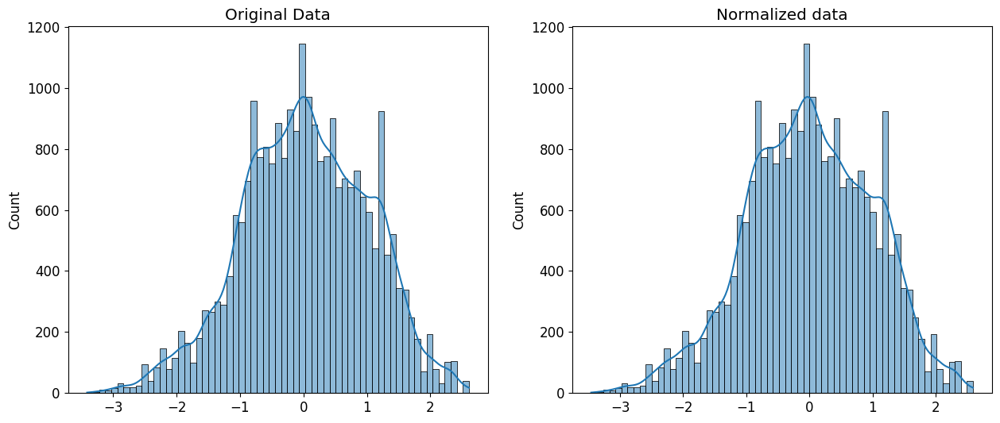

In [31]:
original_data = np.array(df['arousal_tags']).reshape(-1,1)

std = StandardScaler()
normalized_data = std.fit_transform(original_data)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.histplot(original_data, ax=ax[0], kde=True, legend=False)
ax[0].set_title("Original Data")
sns.histplot(normalized_data, ax=ax[1], kde=True, legend=False)
ax[1].set_title("Normalized data")
plt.show()

df['arousal_tags'] = normalized_data

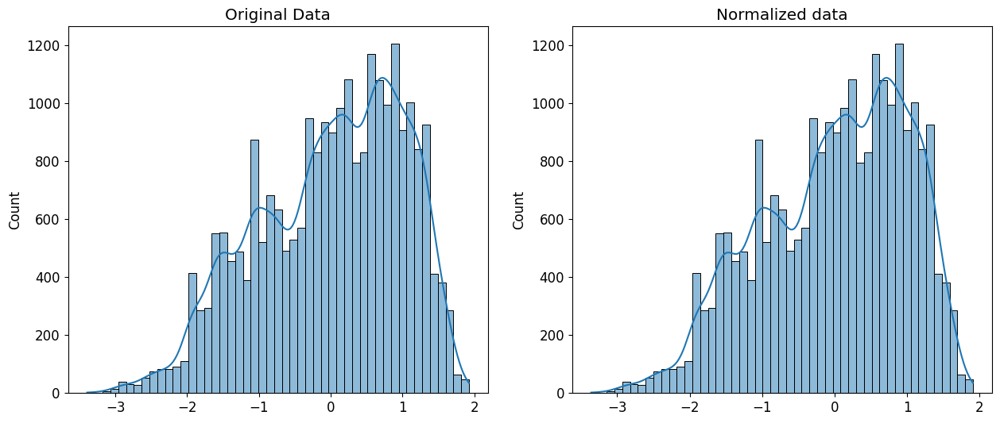

In [32]:
original_data = np.array(df['valence_tags']).reshape(-1,1)

std = StandardScaler()
normalized_data = std.fit_transform(original_data)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.histplot(original_data, ax=ax[0], kde=True, legend=False)
ax[0].set_title("Original Data")
sns.histplot(normalized_data, ax=ax[1], kde=True, legend=False)
ax[1].set_title("Normalized data")
plt.show()

df['valence_tags'] = normalized_data

## Relación de data social vs cuadrante etiqueta

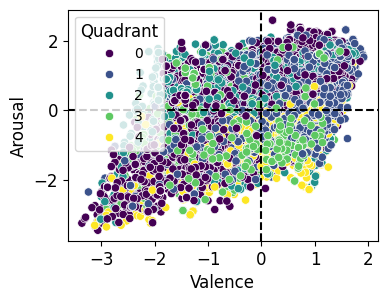

<Figure size 640x480 with 0 Axes>

In [33]:
# crear la figura con un tamaño adecuado
fig, ax = plt.subplots(figsize=(4, 3), dpi=100)

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence_tags', y='arousal_tags', hue='cuadrante', data=df, ax=ax, palette='viridis')

# agregar etiquetas y título
ax.set_xlabel('Valence')
ax.set_ylabel('Arousal')
ax.legend(title='Quadrant', title_fontsize=12, fontsize=10)  # Cambiar nombre de leyenda
#ax.set_title('Relación entre Valencia y Arousal según cuadrante \n para datos socialmente etiquetados')

# agregar líneas de referencia
ax.axhline(y=0, color='black', linestyle='--')
ax.axvline(x=0, color='black', linestyle='--')

# eliminar marcas de rejilla
ax.grid(False)

# mostrar el gráfico
plt.show()

# guardar la figura en formato PNG
plt.savefig('mi_grafica.png', dpi=300, bbox_inches='tight')


### relación por cuadrante

In [34]:
df['valence_tags']  = pd.to_numeric(df['valence_tags'],  errors='coerce')
df['arousal_tags'] = pd.to_numeric(df['arousal_tags'], errors='coerce')

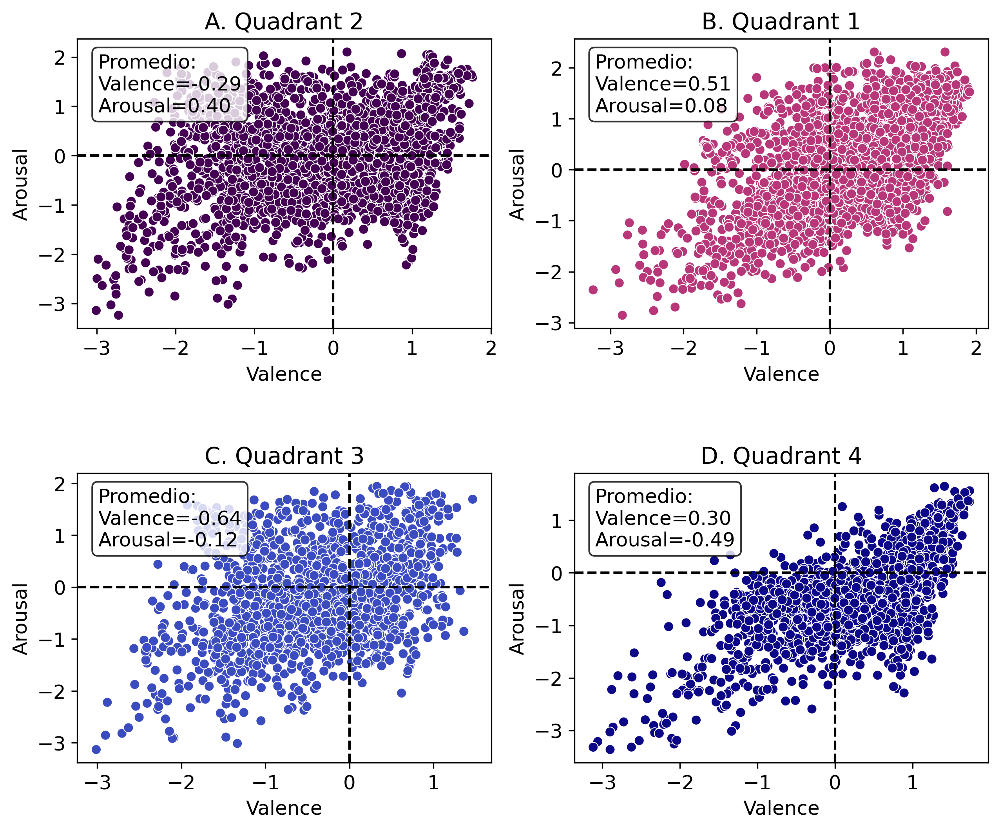

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

df_1 = df[df['cuadrante']==1]
df_2 = df[df['cuadrante']==2]
df_3 = df[df['cuadrante']==3]
df_4 = df[df['cuadrante']==4]
# Crear una figura y dos ejes con la función subplots de Matplotlib
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), dpi=300)

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_2, legend=False, ax=axes[0][0], palette='viridis')
axes[0][0].axhline(y=0, color='black', linestyle='--')
axes[0][0].axvline(x=0, color='black', linestyle='--')
# agregar etiquetas y título
axes[0][0].set_xlabel('Valence', fontsize=12)
axes[0][0].set_ylabel('Arousal', fontsize=12)
axes[0][0].set_title('A. Quadrant 2', fontsize=14)


# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_1, legend=False, ax=axes[0][1], palette='magma')
axes[0][1].axhline(y=0, color='black', linestyle='--')
axes[0][1].axvline(x=0, color='black', linestyle='--')
axes[0][1].set_xlabel('Valence', fontsize=12)
axes[0][1].set_ylabel('Arousal', fontsize=12)
axes[0][1].set_title('B. Quadrant 1', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_3, legend=False, ax=axes[1][0], palette='coolwarm')
axes[1][0].axhline(y=0, color='black', linestyle='--')
axes[1][0].axvline(x=0, color='black', linestyle='--')
axes[1][0].set_xlabel('Valence', fontsize=12)
axes[1][0].set_ylabel('Arousal', fontsize=12)
axes[1][0].set_title('C. Quadrant 3', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_4, legend=False, ax=axes[1][1], palette='plasma')
axes[1][1].axhline(y=0, color='black', linestyle='--')
axes[1][1].axvline(x=0, color='black', linestyle='--')
axes[1][1].set_xlabel('Valence', fontsize=12)
axes[1][1].set_ylabel('Arousal', fontsize=12)
axes[1][1].set_title('D. Quadrant 4', fontsize=14)

# Agregar título al conjunto de gráficas
#fig.suptitle('Distribución de los datos según valores de valence y aurosal por cuadrante', fontsize=14)

fig.subplots_adjust(hspace=0.5, wspace=0.2)

# Calcular el promedio por cuadrante
df_promedios = (
    df
    .groupby('cuadrante')[['valence_tags','arousal_tags']]
    .mean()
    .rename_axis(index='cuadrante')
)

#df_promedios = df_promedios["valence_tags"]
axes[0][0].text(0.05, 0.95, f"Promedio:\nValence={df_promedios['valence_tags'][2]:.2f}\nArousal={df_promedios['arousal_tags'][1]:.2f}", transform=axes[0][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0][1].text(0.05, 0.95, f"Promedio:\nValence={df_promedios['valence_tags'][1]:.2f}\nArousal={df_promedios['arousal_tags'][2]:.2f}", transform=axes[0][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][0].text(0.05, 0.95, f"Promedio:\nValence={df_promedios['valence_tags'][3]:.2f}\nArousal={df_promedios['arousal_tags'][3]:.2f}", transform=axes[1][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][1].text(0.05, 0.95, f"Promedio:\nValence={df_promedios['valence_tags'][4]:.2f}\nArousal={df_promedios['arousal_tags'][4]:.2f}", transform=axes[1][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Mostrar la figura
plt.show()

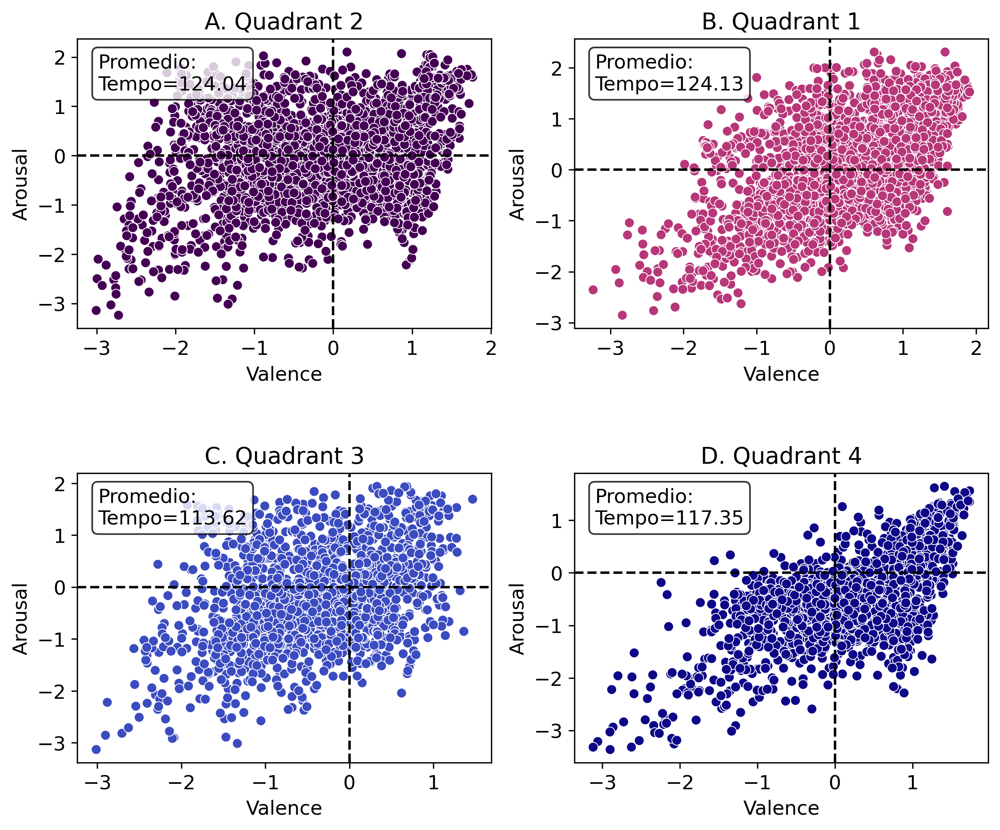

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

df_1 = df[df['cuadrante']==1]
df_2 = df[df['cuadrante']==2]
df_3 = df[df['cuadrante']==3]
df_4 = df[df['cuadrante']==4]
# Crear una figura y dos ejes con la función subplots de Matplotlib
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), dpi=300)

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_2, legend=False, ax=axes[0][0], palette='viridis')
axes[0][0].axhline(y=0, color='black', linestyle='--')
axes[0][0].axvline(x=0, color='black', linestyle='--')
# agregar etiquetas y título
axes[0][0].set_xlabel('Valence', fontsize=12)
axes[0][0].set_ylabel('Arousal', fontsize=12)
axes[0][0].set_title('A. Quadrant 2', fontsize=14)


# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_1, legend=False, ax=axes[0][1], palette='magma')
axes[0][1].axhline(y=0, color='black', linestyle='--')
axes[0][1].axvline(x=0, color='black', linestyle='--')
axes[0][1].set_xlabel('Valence', fontsize=12)
axes[0][1].set_ylabel('Arousal', fontsize=12)
axes[0][1].set_title('B. Quadrant 1', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_3, legend=False, ax=axes[1][0], palette='coolwarm')
axes[1][0].axhline(y=0, color='black', linestyle='--')
axes[1][0].axvline(x=0, color='black', linestyle='--')
axes[1][0].set_xlabel('Valence', fontsize=12)
axes[1][0].set_ylabel('Arousal', fontsize=12)
axes[1][0].set_title('C. Quadrant 3', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_4, legend=False, ax=axes[1][1], palette='plasma')
axes[1][1].axhline(y=0, color='black', linestyle='--')
axes[1][1].axvline(x=0, color='black', linestyle='--')
axes[1][1].set_xlabel('Valence', fontsize=12)
axes[1][1].set_ylabel('Arousal', fontsize=12)
axes[1][1].set_title('D. Quadrant 4', fontsize=14)

# Agregar título al conjunto de gráficas
#fig.suptitle('Distribución de los datos según valores de valence y aurosal por cuadrante', fontsize=14)

fig.subplots_adjust(hspace=0.5, wspace=0.2)

# Calcular el promedio por cuadrante
df_promedios = df.groupby('cuadReal').mean(numeric_only=True)
#df_promedios = df_promedios["valence_tags"]
axes[0][0].text(0.05, 0.95, f"Promedio:\nTempo={df_promedios['tempo'][2]:.2f}", transform=axes[0][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0][1].text(0.05, 0.95, f"Promedio:\nTempo={df_promedios['tempo'][1]:.2f}", transform=axes[0][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][0].text(0.05, 0.95, f"Promedio:\nTempo={df_promedios['tempo'][3]:.2f}", transform=axes[1][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][1].text(0.05, 0.95, f"Promedio:\nTempo={df_promedios['tempo'][4]:.2f}", transform=axes[1][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Mostrar la figura
plt.show()

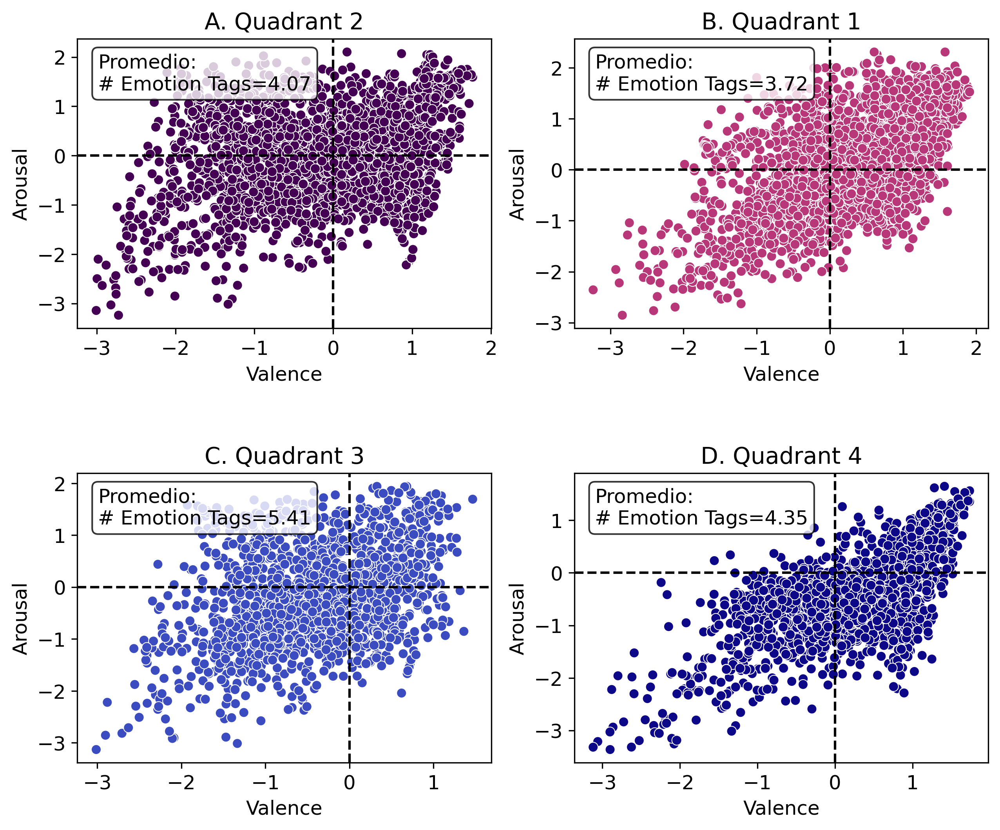

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

df_1 = df[df['cuadrante']==1]
df_2 = df[df['cuadrante']==2]
df_3 = df[df['cuadrante']==3]
df_4 = df[df['cuadrante']==4]
# Crear una figura y dos ejes con la función subplots de Matplotlib
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), dpi=300)

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_2, legend=False, ax=axes[0][0], palette='viridis')
axes[0][0].axhline(y=0, color='black', linestyle='--')
axes[0][0].axvline(x=0, color='black', linestyle='--')
# agregar etiquetas y título
axes[0][0].set_xlabel('Valence', fontsize=12)
axes[0][0].set_ylabel('Arousal', fontsize=12)
axes[0][0].set_title('A. Quadrant 2', fontsize=14)


# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_1, legend=False, ax=axes[0][1], palette='magma')
axes[0][1].axhline(y=0, color='black', linestyle='--')
axes[0][1].axvline(x=0, color='black', linestyle='--')
axes[0][1].set_xlabel('Valence', fontsize=12)
axes[0][1].set_ylabel('Arousal', fontsize=12)
axes[0][1].set_title('B. Quadrant 1', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_3, legend=False, ax=axes[1][0], palette='coolwarm')
axes[1][0].axhline(y=0, color='black', linestyle='--')
axes[1][0].axvline(x=0, color='black', linestyle='--')
axes[1][0].set_xlabel('Valence', fontsize=12)
axes[1][0].set_ylabel('Arousal', fontsize=12)
axes[1][0].set_title('C. Quadrant 3', fontsize=14)

# Graficar la segunda gráfica de barras en el segundo eje
sns.scatterplot(x='valence_tags', y='arousal_tags', hue = 'cuadrante',  data=df_4, legend=False, ax=axes[1][1], palette='plasma')
axes[1][1].axhline(y=0, color='black', linestyle='--')
axes[1][1].axvline(x=0, color='black', linestyle='--')
axes[1][1].set_xlabel('Valence', fontsize=12)
axes[1][1].set_ylabel('Arousal', fontsize=12)
axes[1][1].set_title('D. Quadrant 4', fontsize=14)

# Agregar título al conjunto de gráficas
#fig.suptitle('Distribución de los datos según valores de valence y aurosal por cuadrante', fontsize=14)

fig.subplots_adjust(hspace=0.5, wspace=0.2)

# Calcular el promedio por cuadrante
df_promedios = df.groupby(['cuadReal']).mean(numeric_only=True)
#df_promedios = df_promedios["valence_tags"]
axes[0][0].text(0.05, 0.95, f"Promedio:\n# Emotion Tags={df_promedios['number_of_emotion_tags'][2]:.2f}", transform=axes[0][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[0][1].text(0.05, 0.95, f"Promedio:\n# Emotion Tags={df_promedios['number_of_emotion_tags'][1]:.2f}", transform=axes[0][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][0].text(0.05, 0.95, f"Promedio:\n# Emotion Tags={df_promedios['number_of_emotion_tags'][3]:.2f}", transform=axes[1][0].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axes[1][1].text(0.05, 0.95, f"Promedio:\n# Emotion Tags={df_promedios['number_of_emotion_tags'][4]:.2f}", transform=axes[1][1].transAxes, va='top', fontsize=12, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Mostrar la figura
plt.show()

In [47]:
df_promedios[['valence_tags','arousal_tags']]

,valence_tags,arousal_tags
cuadReal,,
1,0.204348,0.282559
2,-0.143730,0.125464
3,-0.113884,-0.429580
4,0.216773,-0.106365


In [49]:
df_promedios = df.groupby(['cuadReal']).mean(numeric_only=True)
df_promedios[['valence_tags','arousal_tags','number_of_emotion_tags','tempo']]

,valence_tags,arousal_tags,number_of_emotion_tags,tempo
cuadReal,,,,
1,0.204348,0.282559,3.719031,124.134565
2,-0.143730,0.125464,4.074762,124.040101
3,-0.113884,-0.429580,5.408760,113.622859
4,0.216773,-0.106365,4.350315,117.348120


In [51]:
df_promedios = df.groupby(['cuadReal']).mean(numeric_only=True)
df_promedios[['danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature',
       'number_of_emotion_tags', 'valence_tags', 'arousal_tags',
       'dominance_tags']]

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,number_of_emotion_tags,valence_tags,arousal_tags,dominance_tags
cuadReal,,,,,,,,,,,,,,,,,
1,0.600848,0.761909,5.374794,-7.092430,0.656270,0.088640,0.163177,0.115255,0.207830,0.709528,124.134565,235338.249398,3.967668,3.719031,0.204348,0.282559,5.540596
2,0.463576,0.756782,5.255680,-7.124687,0.634254,0.083038,0.131393,0.223277,0.213643,0.289473,124.040101,281453.171390,3.908624,4.074762,-0.143730,0.125464,5.117411
3,0.440728,0.288343,5.084103,-13.808893,0.669186,0.049223,0.624579,0.272015,0.156596,0.214223,113.622859,282647.189337,3.772460,5.408760,-0.113884,-0.429580,5.136741
4,0.637546,0.372916,5.353749,-12.281408,0.690899,0.088713,0.526501,0.131554,0.166316,0.667875,117.348120,225073.562106,3.885518,4.350315,0.216773,-0.106365,5.602950


In [52]:
df['cuadReal'].value_counts()


cuadReal
2    8186
1    7887
3    7146
4    1747
Name: count, dtype: int64

In [53]:
df['cuadrante'].value_counts()

cuadrante
0    11599
1     4724
2     3436
3     2693
4     2514
Name: count, dtype: int64

In [56]:
# agrupa por 'key' y, para cada columna, devuelve su valor modal *primero* en cada grupo
df_promedios = df.groupby('key').agg(lambda x: x.mode().iloc[0])

# ahora puedes seleccionar las dos columnas que quieres
result = df_promedios[['cuadReal','cuadrante']]
result

,cuadReal,cuadrante
key,,
0.0,3,0
1.0,2,0
2.0,2,0
3.0,3,0
4.0,2,0
5.0,1,0
6.0,1,0
7.0,2,0
8.0,2,0


In [57]:
df_grouped = df.groupby(['cuadReal', 'key']).size().reset_index(name='counts')
df_grouped

,cuadReal,key,counts
0,1,0.0,879
1,1,1.0,742
2,1,2.0,857
3,1,3.0,144
4,1,4.0,662
5,1,5.0,614
6,1,6.0,568
7,1,7.0,903
8,1,8.0,456
9,1,9.0,890


In [ ]:
## crear la figura con un tamaño adecuado
#fig, ax = plt.subplots(figsize=(8, 6), dpi=300);

##matplotlib.rcParams['font.family'] = 'Arial'
#matplotlib.rcParams['font.size'] = 12;

## trazar un scatter plot con separación por especie
##sns.scatterplot(x='tempo', y='duration_ms', data=df, ax=ax, palette='viridis');
#sns.pairplot(df)
## agregar etiquetas y título
## eliminar marcas de rejilla
#ax.grid(False)

# mostrar el gráfico
#plt.show()


## Cuadrantes reales spotify

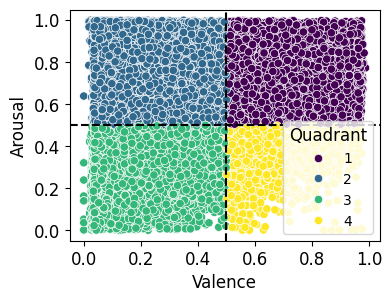

<Figure size 640x480 with 0 Axes>

In [58]:
# crear la figura con un tamaño adecuado
fig, ax = plt.subplots(figsize=(4, 3), dpi=100)

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence', y='energy', hue = df.cuadReal,  data=df,  palette='viridis')

# agregar etiquetas y título
ax.set_xlabel('Valence')
ax.set_ylabel('Arousal')

#ax.set_title('Relación entre Valencia y Arousal según cuadrante \n para datos extraidos de la RRNN de spotify')

# agregar líneas de referencia
ax.axhline(y=0.5, color='black', linestyle='--')
ax.axvline(x=0.5, color='black', linestyle='--')
ax.legend(title='Quadrant', title_fontsize=12, fontsize=10)  # Cambiar nombre de leyenda
# eliminar marcas de rejilla
ax.grid(False)

# mostrar el gráfico
plt.show()

# guardar la figura en formato PNG
plt.savefig('mi_grafica.png', dpi=300, bbox_inches='tight')

## Relación con genero

In [ ]:
df.genre.value_counts()

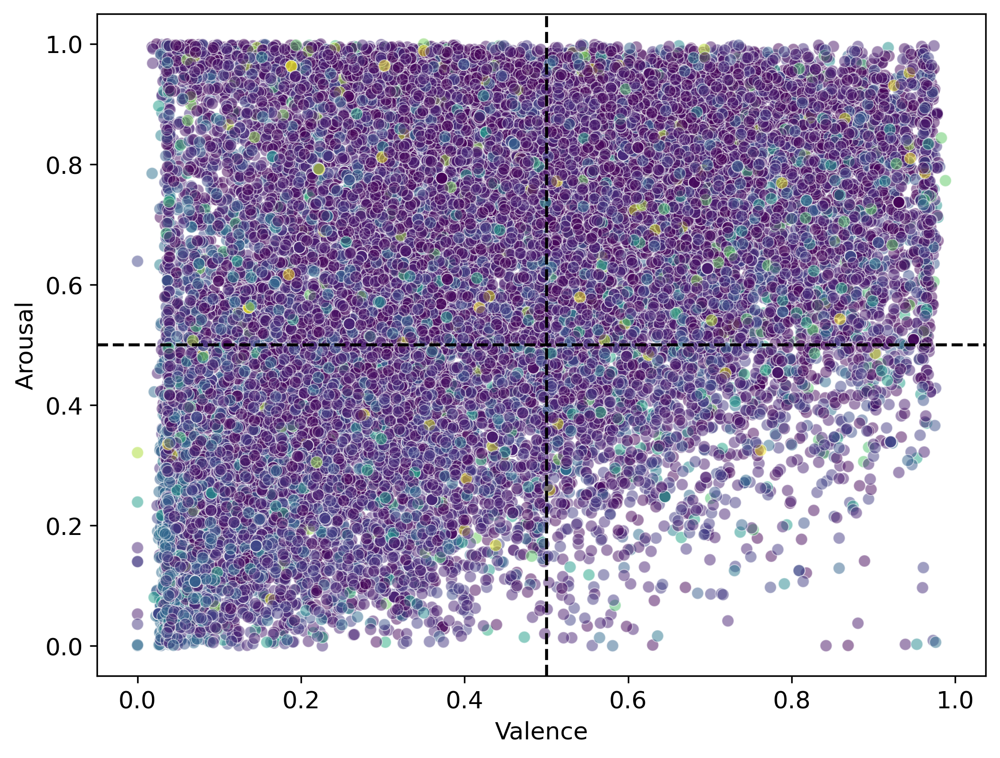

In [59]:
# crear la figura con un tamaño adecuado
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence', y='energy', hue = df["genre"],alpha=0.5,  data=df, legend=False, palette='viridis')

# agregar etiquetas y título
ax.set_xlabel('Valence')
ax.set_ylabel('Arousal')
#ax.set_title('Relación entre Valencia y Arousal según cuadrante \n para datos extraidos de la RRNN de spotify')

# agregar líneas de referencia
ax.axhline(y=0.5, color='black', linestyle='--')
ax.axvline(x=0.5, color='black', linestyle='--')

# eliminar marcas de rejilla
ax.grid(False)

# mostrar el gráfico
plt.show()


# WC

In [60]:
cuadrante1 = {}
cuadrante2 = {}
cuadrante3 = {}
cuadrante4 = {}

for index, row in df.iterrows():
    if row['cuadrante'] == 1:
        words = row['seeds'].split()
        for word in words:
            if word in cuadrante1:
                cuadrante1[word] += 1
            else:
                cuadrante1[word] = 1
    elif row['cuadrante'] == 2:
        words = row['seeds'].split()
        for word in words:
            if word in cuadrante2:
                cuadrante2[word] += 1
            else:
                cuadrante2[word] = 1
    elif row['cuadrante'] == 3:
        words = row['seeds'].split()
        for word in words:
            if word in cuadrante3:
                cuadrante3[word] += 1
            else:
                cuadrante3[word] = 1
    elif row['cuadrante'] == 4:
        words = row['seeds'].split()
        for word in words:
            if word in cuadrante4:
                cuadrante4[word] += 1
            else:
                cuadrante4[word] = 1


In [61]:
wordcloud1 = WordCloud(width=1500, height=1000, background_color='white', colormap='viridis').generate_from_frequencies(cuadrante1)
wordcloud2 = WordCloud(width=1500, height=1000, background_color='white', colormap='viridis').generate_from_frequencies(cuadrante2)
wordcloud3 = WordCloud(width=1500, height=1000, background_color='white', colormap='viridis').generate_from_frequencies(cuadrante3)
wordcloud4 = WordCloud(width=1500, height=1000, background_color='white', colormap='viridis').generate_from_frequencies(cuadrante4)


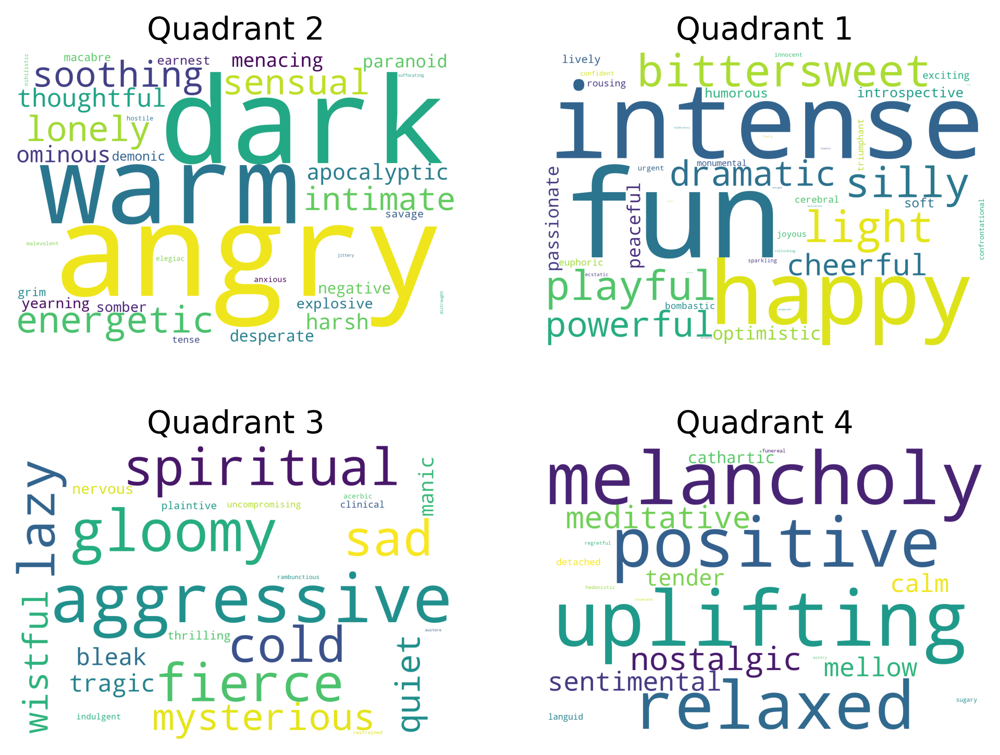

In [62]:
fig, axs = plt.subplots(2, 2,figsize=(8, 6), dpi=300)
matplotlib.rcParams['font.size'] = 12

axs[0, 0].imshow(wordcloud2)
axs[0, 0].set_title('Quadrant 2')

axs[0, 1].imshow(wordcloud1)
axs[0, 1].set_title('Quadrant 1')

axs[1, 0].imshow(wordcloud3)
axs[1, 0].set_title('Quadrant 3')

axs[1, 1].imshow(wordcloud4)
axs[1, 1].set_title('Quadrant 4')

for ax in axs.flat:
    ax.axis('off')

plt.show()


In [65]:
#df.groupby(['cuadReal']).mean(numerical_columns=True)

In [66]:
df['key'].value_counts()

key
0.0     3025
7.0     2942
2.0     2892
9.0     2838
4.0     2187
1.0     2133
11.0    1972
5.0     1886
6.0     1538
10.0    1489
8.0     1373
3.0      691
Name: count, dtype: int64

# letras


In [67]:
df = df[df["emocion_mas_comun"] > 0]
df = df[df["hasLetra"] >0]

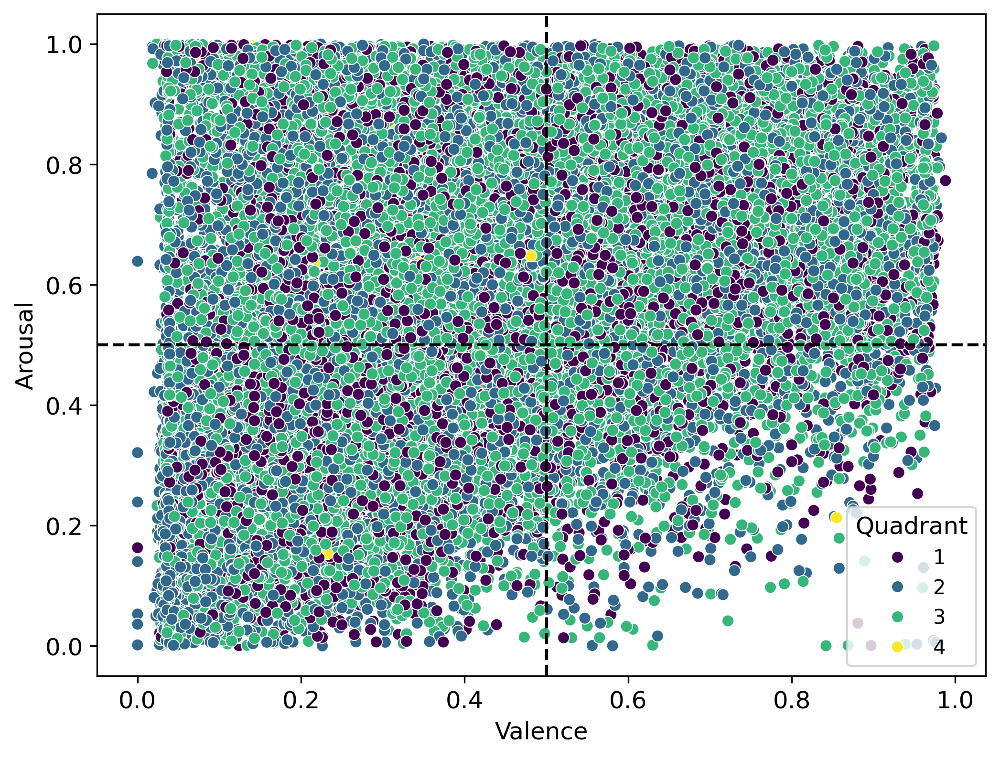

<Figure size 640x480 with 0 Axes>

In [68]:
# crear la figura con un tamaño adecuado
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12

# trazar un scatter plot con separación por especie
sns.scatterplot(x='valence', y='energy', hue = "emocion_mas_comun",  data=df,  palette='viridis')

# agregar etiquetas y título
ax.set_xlabel('Valence')
ax.set_ylabel('Arousal')
#ax.set_title('Relación entre Valencia y Arousal según cuadrante \n para datos extraidos de la RRNN de spotify')

# agregar líneas de referencia
ax.axhline(y=0.5, color='black', linestyle='--')
ax.axvline(x=0.5, color='black', linestyle='--')
ax.legend(title='Quadrant', title_fontsize=12, fontsize=10)

# eliminar marcas de rejilla
ax.grid(False)

# mostrar el gráfico
plt.show()

# guardar la figura en formato PNG
plt.savefig('mi_grafica.png', dpi=300, bbox_inches='tight')

In [69]:
#spotify vs etiquetas
diference_cuad_emocion_mas_comun = 0
normi = 0

for k, i in enumerate(df["cuadrante"]):
  if(df["cuadReal"].iloc[k] == df["cuadrante"].iloc[k]):
    diference_cuad_emocion_mas_comun += 1
  else:
    normi +=1
diference_cuad_emocion_mas_comun , normi, len(df["cuadReal"])

(4240, 20726, 24966)

In [70]:
#letra vs etiquetas
diference_cuad_emocion_mas_comun = 0
normi = 0

for k, i in enumerate(df["cuadrante"]):
  if(df["cuadrante"].iloc[k] == df["emocion_mas_comun"].iloc[k]):
    diference_cuad_emocion_mas_comun += 1
  else:
    normi +=1
diference_cuad_emocion_mas_comun , normi, len(df["cuadrante"])

(3345, 21621, 24966)

In [71]:
#letra vs spotify
diference_cuad_emocion_mas_comun = 0
normi = 0

for k, i in enumerate(df["cuadReal"]):
  if(df["cuadReal"].iloc[k] == df["emocion_mas_comun"].iloc[k]):
    diference_cuad_emocion_mas_comun += 1
  else:
    normi +=1

diference_cuad_emocion_mas_comun , normi, len(df["cuadReal"])


(7205, 17761, 24966)

24966
0.7114075142193383
0.2885924857806617
1.0


C:\Users\andre\AppData\Local\Temp\ipykernel_26032\2220992754.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='variable', y= 'prop',  data=df_prop,  palette='Spectral')


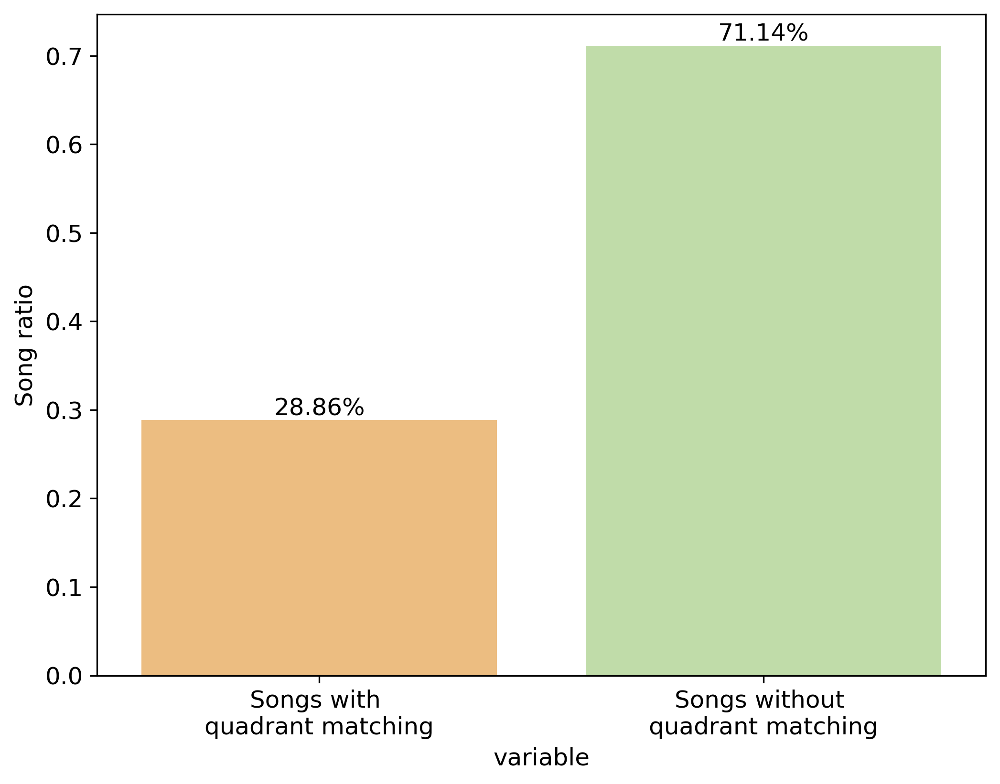

In [72]:
# crear la figura con un tamaño adecuado
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

#matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = 12


# Calcular las proporciones
total = len(df["cuadrante"])
prop_dif_cuad_emocion_mas_comun = diference_cuad_emocion_mas_comun / total
prop_normi = normi / total
print(total)
print(prop_normi)
print(prop_dif_cuad_emocion_mas_comun)
print(prop_dif_cuad_emocion_mas_comun+prop_normi)

df_prop = {'prop': [prop_dif_cuad_emocion_mas_comun, prop_normi], 'variable': ["Songs with \nquadrant matching", "Songs without \nquadrant matching"]}

# trazar un scatter plot con separación por especie
sns.barplot(x='variable', y= 'prop',  data=df_prop,  palette='Spectral')
# agregar etiquetas de anotación en cada barra
for i, v in enumerate(df_prop['prop']):
    ax.annotate(str(round(v*100,2)) + "%", xy=(i, v), ha='center', va='bottom')

# agregar etiquetas y título
ax.set_ylabel('Song ratio')
#ax.set_ylabel('Arousal')
#ax.set_title('Relación entre Valencia y Arousal según cuadrante \n para datos extraidos de la RRNN de spotify')

# agregar líneas de referencia
#ax.axhline(y=0.5, color='black', linestyle='--')
#ax.axvline(x=0.5, color='black', linestyle='--')
#ax.legend(title='Quadrant', title_fontsize=12, fontsize=10)

# eliminar marcas de rejilla
ax.grid(False)

# mostrar el gráfico
plt.show()

# guardar la figura en formato PNG
#plt.savefig('mi_grafica.png', dpi=300, bbox_inches='tight')

In [ ]:
#df.to_csv('Data_completa_enrriquecida.csv', header=True, index=False)